In [1]:
import sys
import matplotlib.pyplot as plt
import numpy as np    

%matplotlib inline
import pandas as pd
from scipy.optimize import curve_fit
from scipy.stats import chisquare
import scipy.stats as stats
from itertools import combinations
import math
import os
import time


from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
myhost = os.uname()[1]
if myhost == 'macmazzitelli.lnf.infn.it':
    mybasepath = '/Users/mazzitel/Dropbox/GR2/soft/data/'
    sys.path.append('../lib')
    posix=False
else:
    mybasepath = '/workarea/cloud-storage/mazzitel/'
    posix=True
print("Host:", myhost)
print (sys.version, get_ipython())
if 'google.colab' in str(get_ipython()) and sys.version[0:1] in '3':
    mybasepath = './'
    posix=False
    print('Running on CoLab')
    !wget https://raw.githubusercontent.com/gmazzitelli/cygno_cloud/main/cygnus_lib.py
    !wget https://raw.githubusercontent.com/gmazzitelli/cygno/master/mylib.py
    !madir out
    !mkdir ped
    # credits https://gist.github.com/MohamedElashri/
    !wget https://s3.cloud.infn.it/v1/AUTH_2ebf769785574195bde2ff418deac08a/cygnus/Analysis/root.tar.gz
    !gunzip root.tar.gz
    !tar -xf  root.tar
    !apt-get install git dpkg-dev cmake g++ gcc binutils libx11-dev libxpm-dev libxft-dev libxext-dev tar gfortran subversion
    !install root_numpy
    
    import sys
    sys.path.append("/content/root_build/")
    sys.path.append("/content/root_build/bin/")
    sys.path.append("/content/root_build/include/")
    sys.path.append("/content/root_build/lib/")
    import ctypes
    libfile = !ls /content/root_build/lib/*.so*
    for i, lib in enumerate(libfile):
        if not (lib=='/content/root_build/lib/libtbbmalloc_proxy.so' or lib=='/content/root_build/lib/libtbbmalloc.so' or lib=='/content/root_build/lib/libtbb.so'): 
            ctypes.cdll.LoadLibrary(lib)
    !pip install root-numpy

import cygnus_lib as cy
import mylib as my
import ROOT
import root_numpy as rtnp

Host: 10a4392527c7
3.6.8 (default, Nov 16 2020, 16:55:22) 
[GCC 4.8.5 20150623 (Red Hat 4.8.5-44)] <ipykernel.zmqshell.ZMQInteractiveShell object at 0x7fa4211ed5f8>
Welcome to JupyROOT 6.22/06


In [2]:
def Gauss3(x, a0, x0, s0):
    import numpy as np
    return a0 * np.exp(-(x - x0)**2 / (2 * s0**2))
    
def histGaus(var, bins, ax, color='b', xrange=False, alpha=1, label=''):
    from sklearn.metrics import r2_score
    from scipy.stats import chisquare
    import scipy.stats as stats
    if xrange:
        ax.hist(var, bins=bins, label=label, color=color, range=(xrange[0], xrange[1]), alpha=alpha)
        y, bins_edge = np.histogram(var, bins=bins, range=(xrange[0], xrange[1]))
    else:
        ax.hist(var, bins=bins, label=label, color=color)
        y, bins_edge = np.histogram(var, bins=bins)
    p0=[y.max(),bins_edge[y.argmax()], var.std()]
    x = np.linspace(bins_edge[0], bins_edge[-1], bins)
    popt, pcov = curve_fit(Gauss3, x, y, p0=p0)
    perr = np.sqrt(np.diag(pcov))
    r2=r2_score(y, Gauss3(x, *popt))
    x = np.linspace(bins_edge[0], bins_edge[-1], 100)
    sstat='a = {0:.2f} +/- {1:.2f}\nb = {2:.2f} +/- {3:.2f} \
    \nc = {4:.2f} +/- {5:.2f}\n$R^2$ = {6:.4f}'.format(popt[0], perr[0], popt[1], perr[1], 
                                                popt[2], perr[2], r2)
    ax.plot(x,Gauss3(x, *popt), color+'--', label=sstat)
    return ax
def ExpG(x, p0, p1, a0, x0, s0): # power of ten
    import numpy as np
    return p0*np.exp(p1*x) + a0 * np.exp(-(x - x0)**2 / (2 * s0**2))

def Exp(x, p0, p1): # power of ten
    import numpy as np
    return p0*np.exp(p1*x)

def G3(x, a0, x0, s0): # power of ten
    import numpy as np
    return a0 * np.exp(-(x - x0)**2 / (2 * s0**2))

def myExpG(data,ax, xmin, xmax, bins, E0, E1, a0, x0, s0):
    y = data[(data > xmin) & (data < xmax)]
    binsf = int(bins*((xmax-xmin)/(y.max()-y.min())))
    x=np.linspace(xmin , xmax, binsf)
    yh, _ = np.histogram(y, bins=binsf, range=(xmin,xmax))
    popt, pcov = curve_fit(ExpG, x, yh, 
                            p0=(E0, E1, a0, x0, s0))    
    #print ("Params: ", popt) 
    perr = np.sqrt(np.diag(pcov))
    #print ("err: ", perr)
    # plt.title(r'E0*$e^{(E1*x)}$ + a0*$e^{-\frac{(x - x0)^2}{2*s0^2}}$', fontsize=30)
    ax.plot(x, ExpG(x, *popt), 'r--', linewidth=2,
    label='E0 = %.2e +/- %.2e\nE1 = %.2e +/- %.2e\na0 = %.2e +/- %.2e\nx0 = %.2e +/- %.2e\ns0 = %.2e +/- %.2e' % 
                          (popt[0], perr[0],  popt[1],perr[1],
                           popt[2],perr[2], popt[3], perr[3], popt[4], perr[4]))
    ax.plot(x, G3(x, popt[2], popt[3], popt[4]), 'b-', label='signal')
    ax.plot(x, Exp(x, popt[0], popt[1]), 'y-', label='background')
    return ax, popt




rascale:  4
/workarea/cloud-storage/mazzitel/ped/run4038_mean.h5 /workarea/cloud-storage/mazzitel/ped/run4038_sigma.h5
light over Th: 9815004.83 
Open file: /workarea/cloud-storage/cygnus/Data/LAB/histograms_Run04039.root
Find Keys: 200
# of Images (TH2) Files: 200 
# of Waveform (TH2) Files: 0 
Camera X, Y pixel: 2304 2304 
Processing RUN:  4039 Event:  0
DEBUG: number of points, clusters: 22928 0
(array([267.16712948, 288.07026154]), array([0.4047631 , 0.91442159]))
(array([250.96022331, 257.25680391]), array([0.71612348, 0.69797362]))
ph 73126, dim: 22928
x,y start: 216, 148, x,y stop: 2108, 2152, length: 2756: 
Mean squared error: 63.74
Coefficient of determination: 0.9947


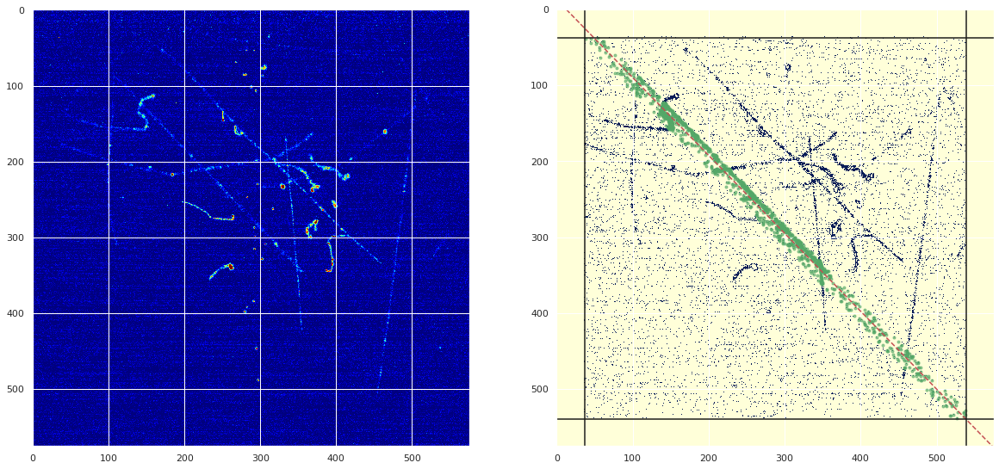

DEBUG: number of points, clusters: 22384 1
(array([268.81988329, 291.21256761]), array([-0.0097604 ,  0.99995237]))
(array([215.77055039, 331.41958542]), array([0.7015255 , 0.71264435]))
ph 79372, dim: 22384
x,y start: 556, 148, x,y stop: 2124, 1688, length: 2198: 
Mean squared error: 41.13
Coefficient of determination: 0.9947


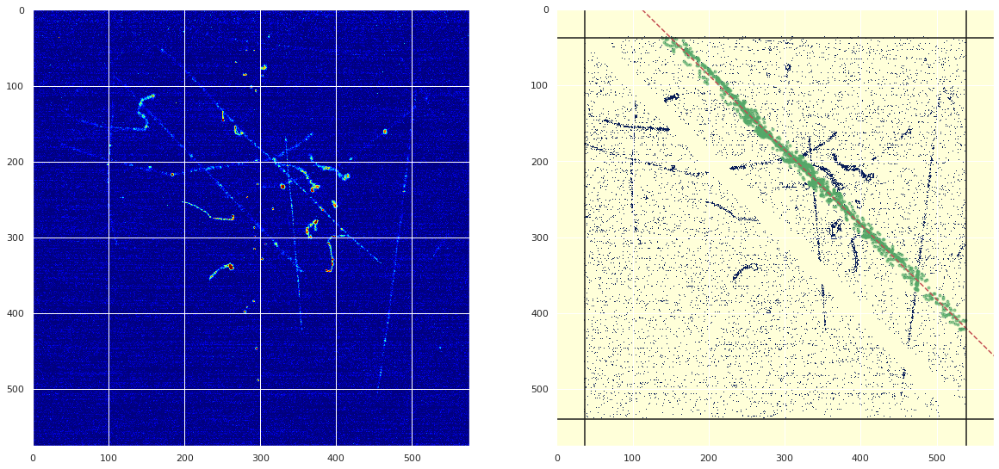

DEBUG: number of points, clusters: 17264 2
(array([274.68537106, 286.76701178]), array([-0.20995338,  0.9777114 ]))
(array([190.8257646 , 285.06580167]), array([0.20511767, 0.97873732]))
ph 61126, dim: 17264
x,y start: 168, 528, x,y stop: 2144, 1008, length: 2033: 
Mean squared error: 646.20
Coefficient of determination: 0.9682


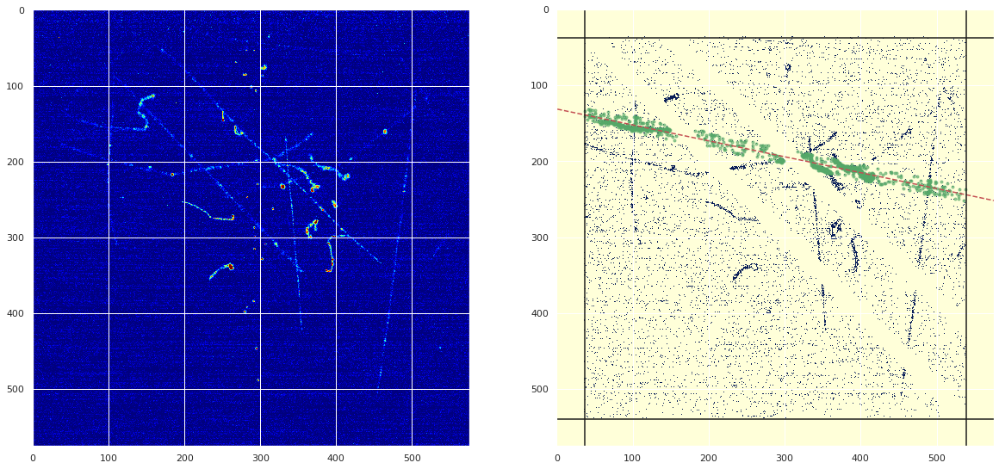

DEBUG: number of points, clusters: 14400 3
(array([282.50328322, 286.92560912]), array([-0.41600157,  0.9093639 ]))
(array([286.28777778, 315.39111111]), array([ 0.65038122, -0.75960797]))
ph 45804, dim: 14400
x,y start: 2148, 372, x,y stop: 160, 2144, length: 2663: 
Mean squared error: 63.44
Coefficient of determination: 0.9968


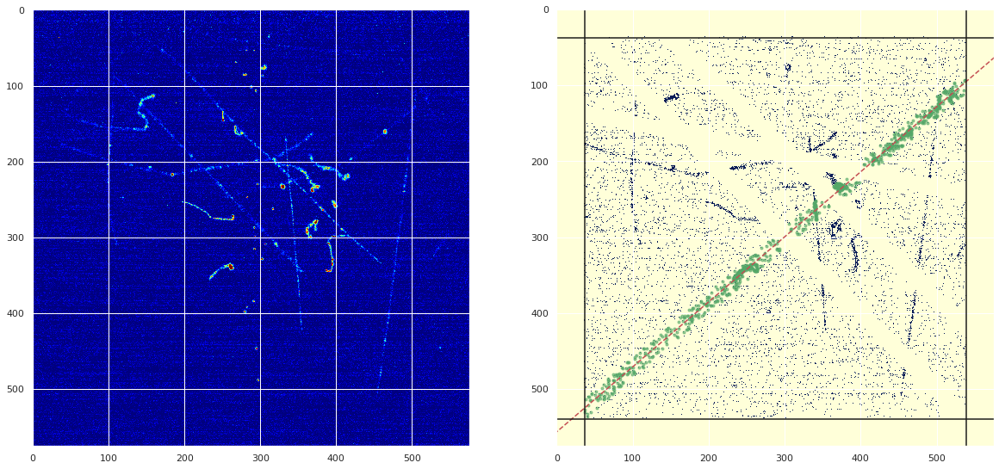

DEBUG: number of points, clusters: 12304 4
(array([282.18418587, 284.52548248]), array([0.15528926, 0.98786904]))
(array([252.88426528, 307.16254876]), array([0.67370148, 0.73900359]))
ph 39905, dim: 12304
x,y start: 280, 152, x,y stop: 2140, 1884, length: 2542: 
Mean squared error: 68.90
Coefficient of determination: 0.9953


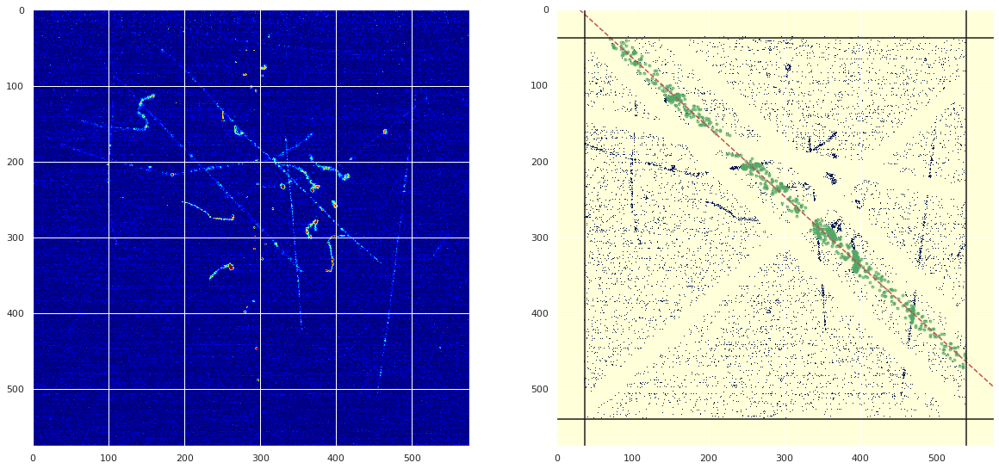

DEBUG: number of points, clusters: 12192 5
(array([284.45896012, 282.76799596]), array([-0.37722971,  0.92611972]))
(array([303.32152231, 266.25459318]), array([0.70503682, 0.7091707 ]))
ph 34636, dim: 12192
x,y start: 168, 272, x,y stop: 2012, 2144, length: 2628: 
Mean squared error: 68.61
Coefficient of determination: 0.9956


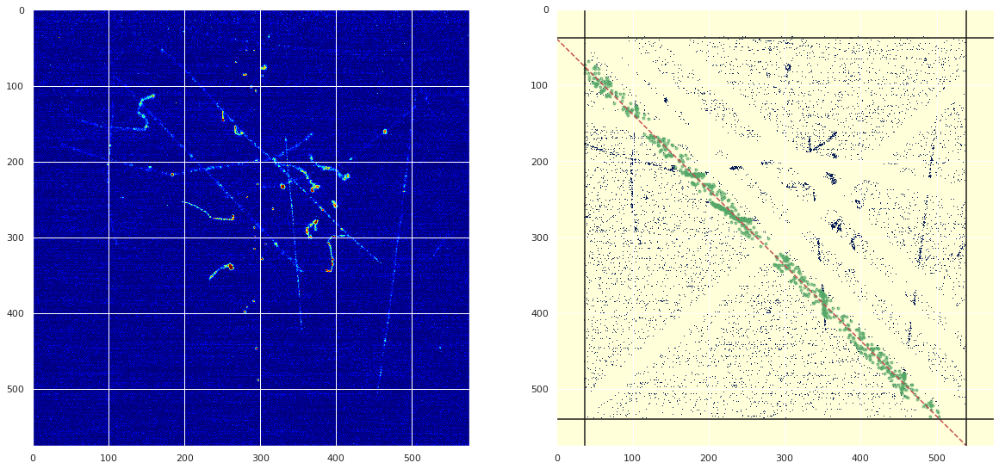

DEBUG: number of points, clusters: 10288 6
(array([282.88690802, 284.14426337]), array([-0.56535034,  0.82485089]))
(array([259.1399689 , 273.81648523]), array([ 0.70459383, -0.70961083]))
ph 26192, dim: 10288
x,y start: 1952, 156, x,y stop: 156, 2004, length: 2577: 
Mean squared error: 64.91
Coefficient of determination: 0.9963


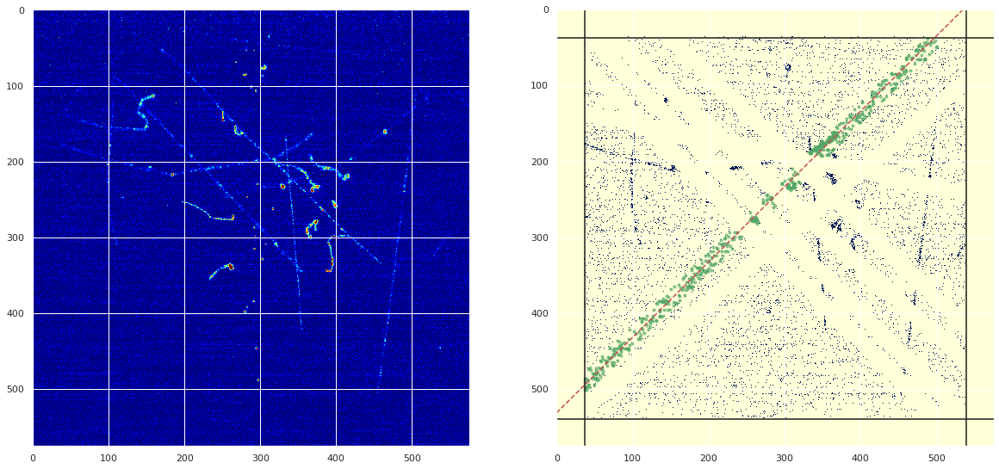

DEBUG: number of points, clusters: 9888 7
(array([284.68329412, 284.92552941]), array([-0.3922745,  0.9198482]))
(array([248.39805825, 257.31229773]), array([0.30981899, 0.95079556]))
ph 31073, dim: 9888
x,y start: 160, 672, x,y stop: 2124, 1364, length: 2082: 
Mean squared error: 252.69
Coefficient of determination: 0.9910


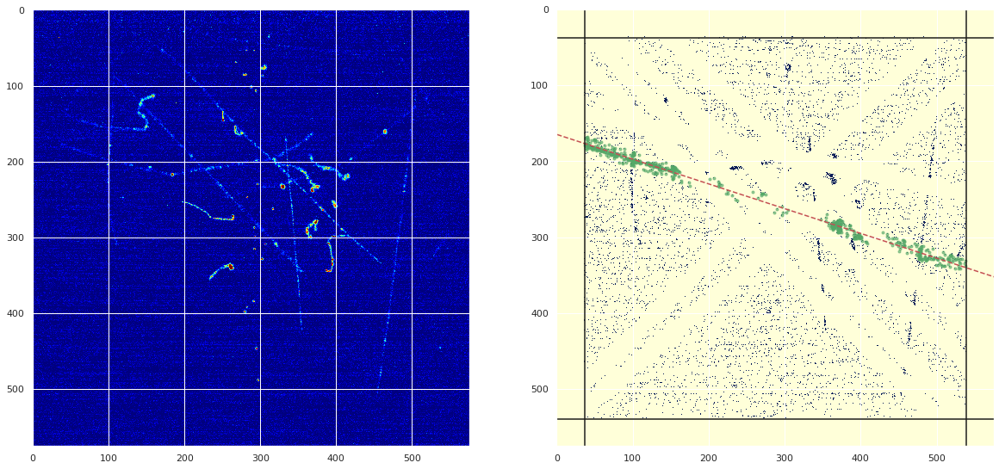

DEBUG: number of points, clusters: 8096 8
(array([287.52829231, 287.09058615]), array([ 0.71431504, -0.69982428]))
(array([260.65810277, 333.6541502 ]), array([0.98686001, 0.16157761]))
ph 24746, dim: 8096
x,y start: 1184, 148, x,y stop: 1496, 2108, length: 1985: 
Mean squared error: 28.17
Coefficient of determination: 0.9530


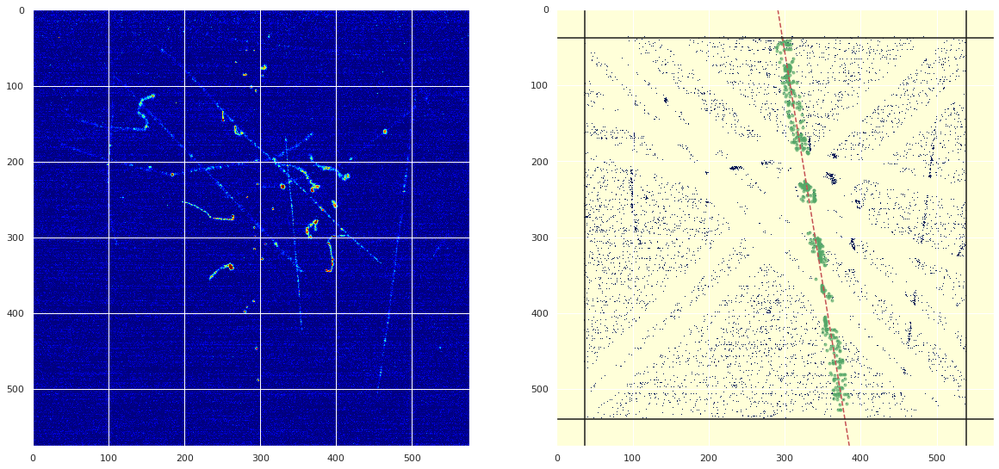

DEBUG: number of points, clusters: 8064 9
(array([289.37161063, 283.89628525]), array([-0.59470791,  0.80394185]))
(array([286.37301587, 483.9265873 ]), array([ 0.98662576, -0.16300188]))
ph 22134, dim: 8064
x,y start: 2088, 160, x,y stop: 1756, 2148, length: 2016: 
Mean squared error: 27.90
Coefficient of determination: 0.9416


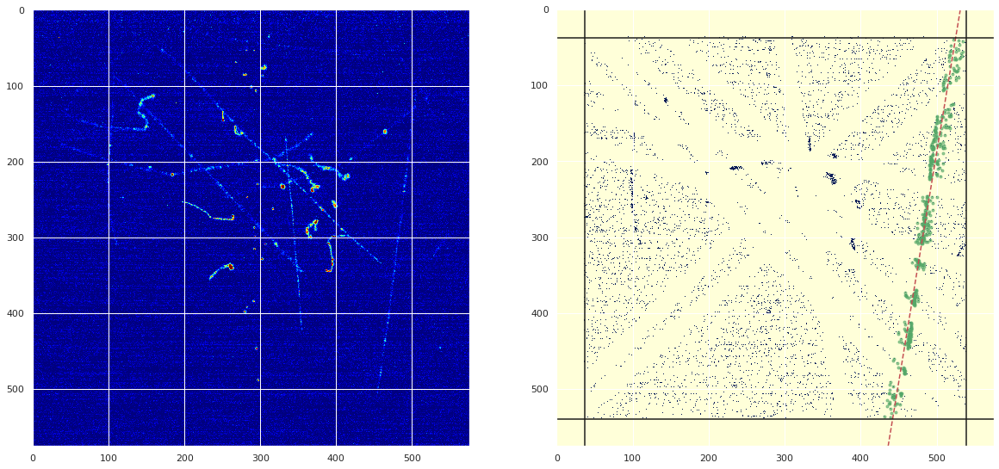

Elapsed time 10 events: 15.6
Processing RUN:  4039 Event:  1
DEBUG: number of points, clusters: 18832 0
(array([267.3593475 , 278.82503046]), array([-0.58619265,  0.81017169]))
(array([261.71028037, 303.84451997]), array([-0.17011552,  0.98542413]))
ph 59793, dim: 18832
x,y start: 2068, 864, x,y stop: 156, 1272, length: 1955: 
Mean squared error: 1039.01
Coefficient of determination: 0.9417


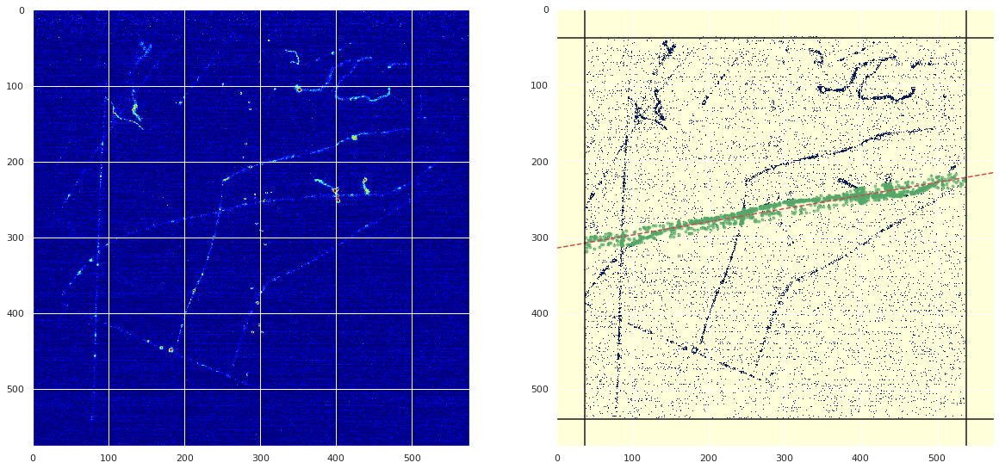

DEBUG: number of points, clusters: 17152 1
(array([267.8483489 , 276.65926307]), array([ 0.73187604, -0.68143779]))
(array([287.70802239,  90.59981343]), array([ 0.9977322 , -0.06730871]))
ph 51007, dim: 17152
x,y start: 476, 164, x,y stop: 308, 2152, length: 1995: 
Mean squared error: 28.78
Coefficient of determination: 0.7311


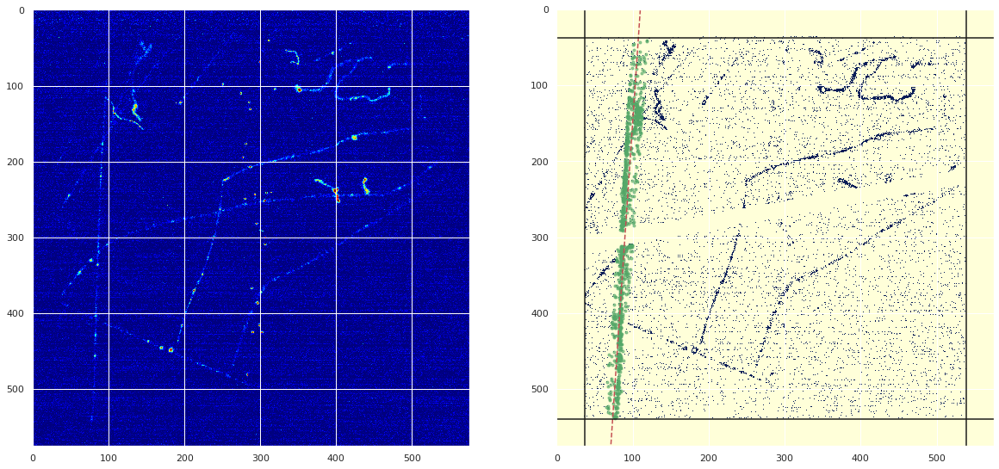

DEBUG: number of points, clusters: 15536 2
(array([266.14858283, 292.58387226]), array([ 0.88734235, -0.46111121]))
(array([265.37796087, 370.28733265]), array([ 0.86800575, -0.49655414]))
ph 51537, dim: 15536
x,y start: 2040, 152, x,y stop: 900, 2152, length: 2302: 
Mean squared error: 45.00
Coefficient of determination: 0.9931


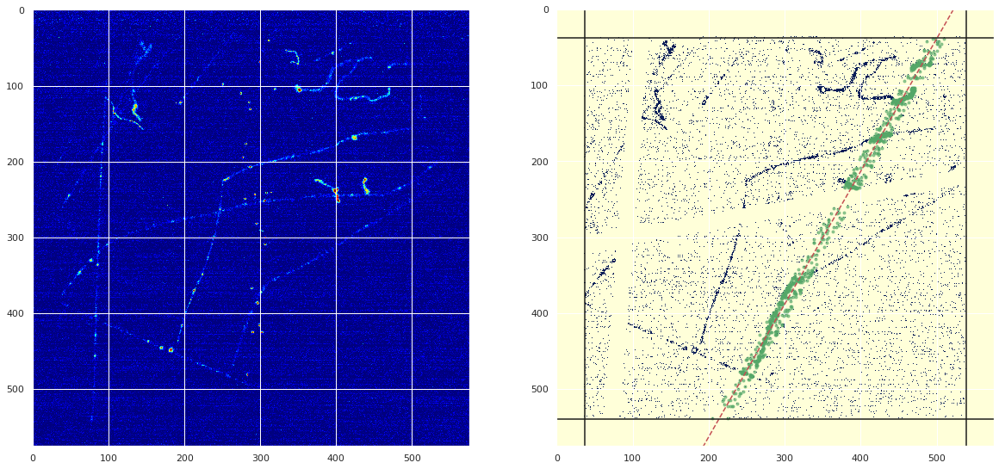

DEBUG: number of points, clusters: 15440 3
(array([266.21334603, 286.05366107]), array([ 0.95187571, -0.30648432]))
(array([259.30259067, 287.6642487 ]), array([ 0.84024096, -0.54221318]))
ph 48127, dim: 15440
x,y start: 1776, 148, x,y stop: 424, 2152, length: 2417: 
Mean squared error: 49.54
Coefficient of determination: 0.9945


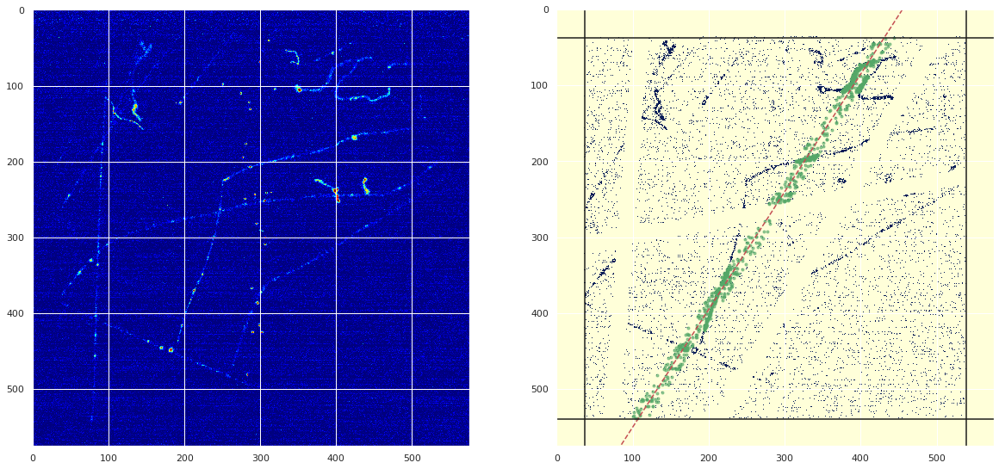

DEBUG: number of points, clusters: 12640 4
(array([266.84313911, 285.9068845 ]), array([0.83829235, 0.54522099]))
(array([208.62405063, 125.20632911]), array([ 0.99451633, -0.1045814 ]))
ph 39766, dim: 12640
x,y start: 548, 152, x,y stop: 360, 2152, length: 2009: 
Mean squared error: 27.82
Coefficient of determination: 0.8940


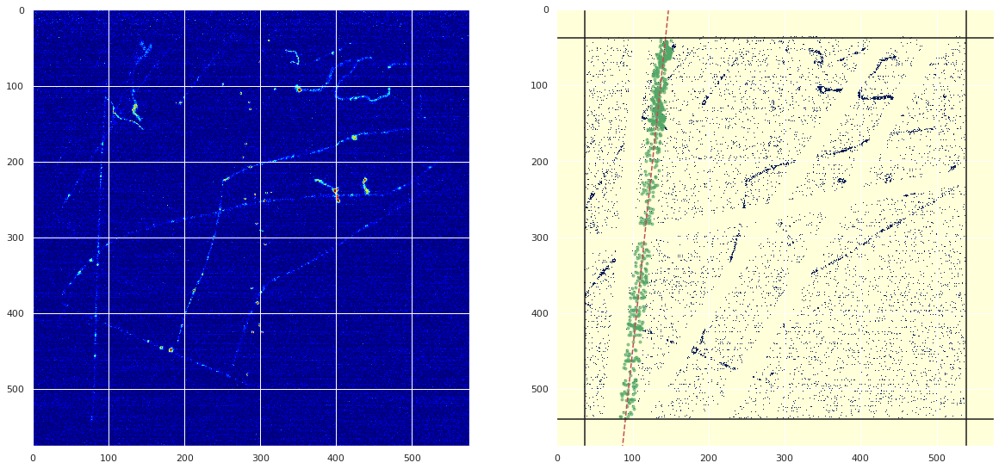

DEBUG: number of points, clusters: 11360 5
(array([271.53678947, 298.86263904]), array([0.99773222, 0.06730833]))
(array([223.04084507, 264.31408451]), array([ 0.79245558, -0.60992963]))
ph 35055, dim: 11360
x,y start: 1624, 156, x,y stop: 156, 2104, length: 2439: 
Mean squared error: 52.67
Coefficient of determination: 0.9947


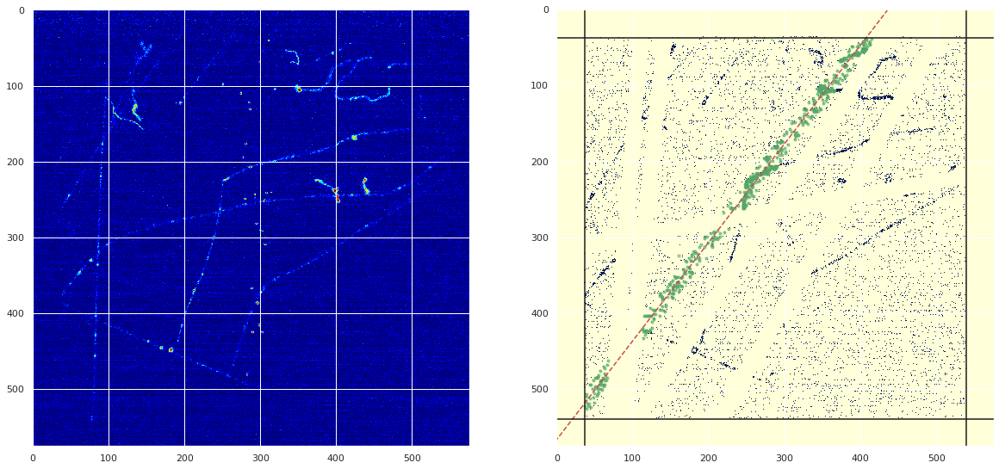

DEBUG: number of points, clusters: 10976 6
(array([275.32511827, 301.5614479 ]), array([0.76439897, 0.64474352]))
(array([242.28717201, 327.98979592]), array([ 0.85559908, -0.51763907]))
ph 29938, dim: 10976
x,y start: 1824, 148, x,y stop: 548, 2152, length: 2376: 
Mean squared error: 44.52
Coefficient of determination: 0.9947


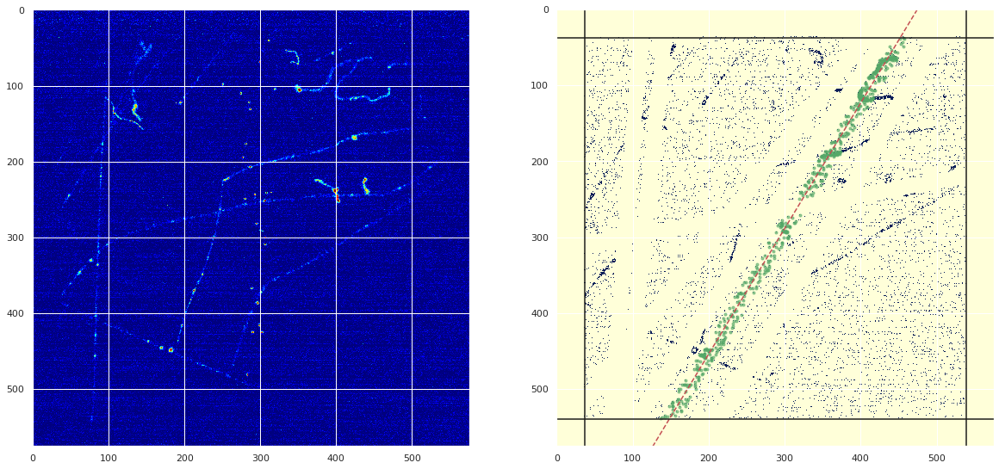

DEBUG: number of points, clusters: 9936 7
(array([278.02225396, 299.40390337]), array([0.63489416, 0.77259913]))
(array([261.60869565, 342.66827697]), array([ 0.85391214, -0.52041719]))
ph 29113, dim: 9936
x,y start: 1896, 164, x,y stop: 700, 2152, length: 2320: 
Mean squared error: 52.31
Coefficient of determination: 0.9929


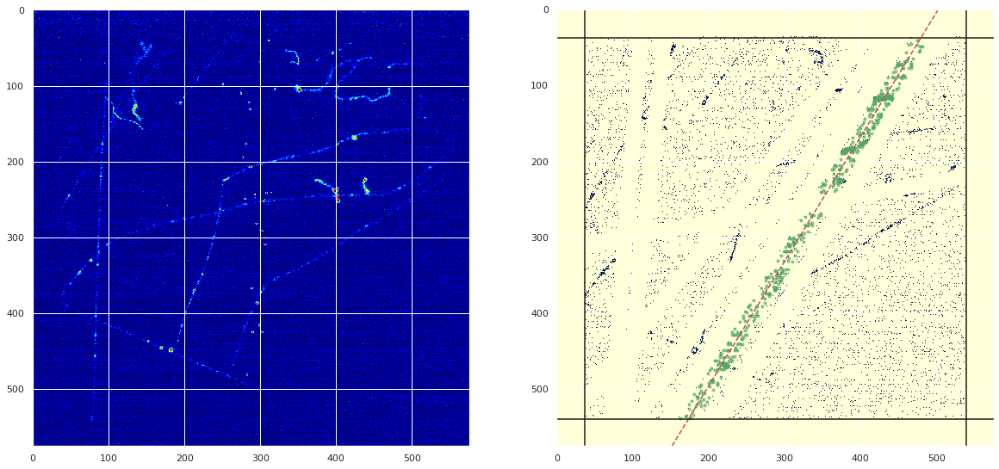

DEBUG: number of points, clusters: 8848 8
(array([279.33204832, 295.95142637]), array([0.61024776, 0.79221063]))
(array([341.30379747, 349.95660036]), array([ 0.5196971 , -0.85435058]))
ph 24372, dim: 8848
x,y start: 2136, 928, x,y stop: 196, 2144, length: 2290: 
Mean squared error: 72.50
Coefficient of determination: 0.9956


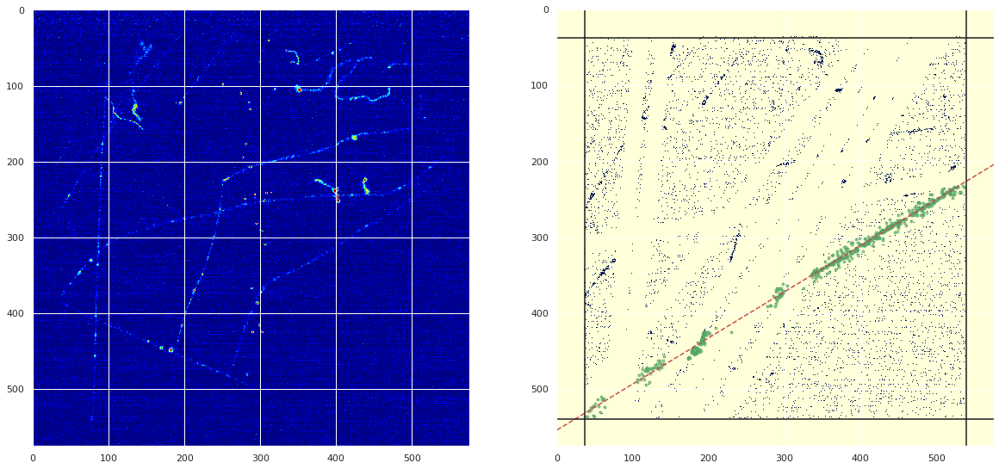

DEBUG: number of points, clusters: 7824 9
(array([274.5913681 , 291.82016876]), array([0.65413994, 0.75637354]))
(array([284.5194274 , 390.95092025]), array([ 0.86473902, -0.50222149]))
ph 20040, dim: 7824
x,y start: 2104, 148, x,y stop: 1000, 2152, length: 2288: 
Mean squared error: 44.97
Coefficient of determination: 0.9945


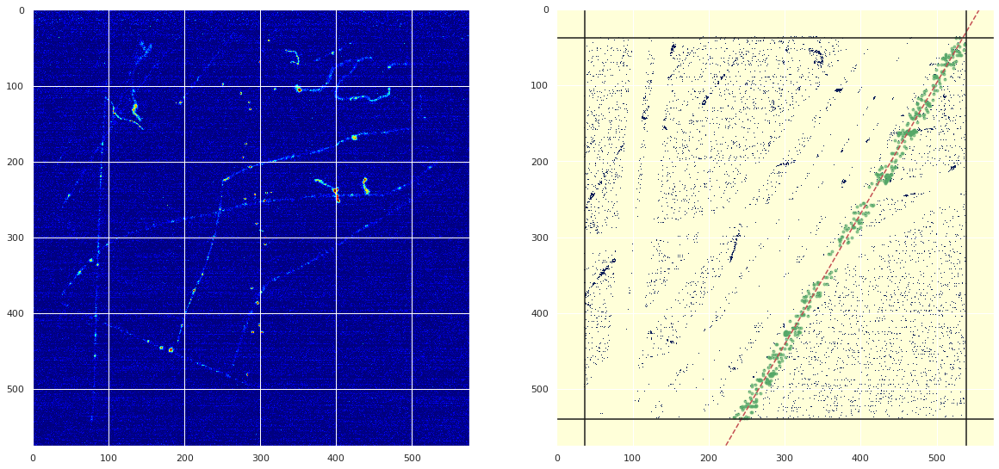

Elapsed time 10 events: 15.4
Processing RUN:  4039 Event:  2
DEBUG: number of points, clusters: 22080 0
(array([265.36234776, 267.84896443]), array([-0.39020331,  0.92072872]))
(array([271.48043478, 179.62101449]), array([ 0.91096987, -0.41247291]))
ph 65204, dim: 22080
x,y start: 1120, 152, x,y stop: 248, 2152, length: 2182: 
Mean squared error: 34.44
Coefficient of determination: 0.9903


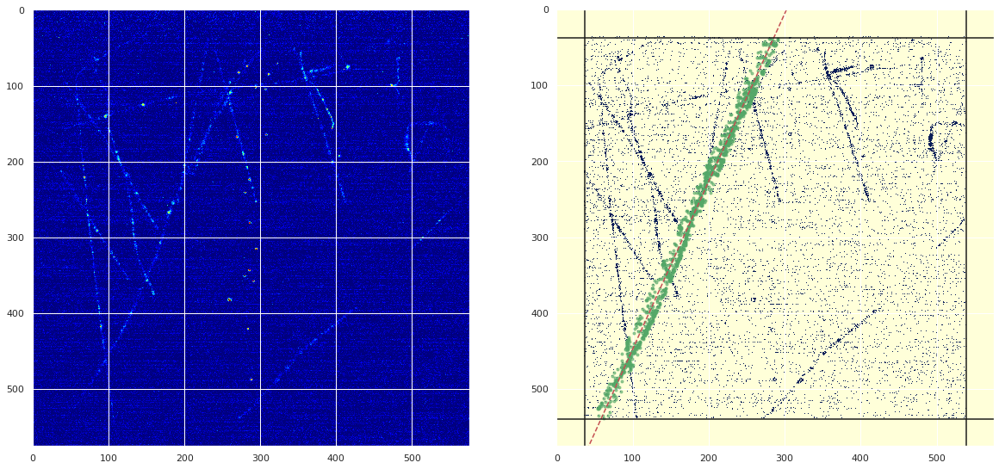

DEBUG: number of points, clusters: 15568 1
(array([264.72044401, 277.10575534]), array([-0.00224388,  0.99999748]))
(array([106.90955807, 272.24357657]), array([-0.18823483,  0.98212405]))
ph 48140, dim: 15568
x,y start: 2052, 216, x,y stop: 156, 652, length: 1945: 
Mean squared error: 810.62
Coefficient of determination: 0.9584


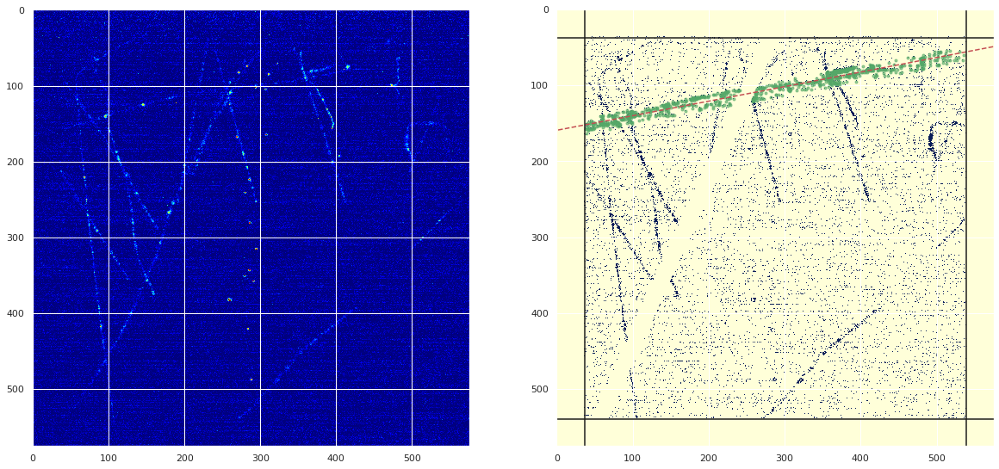

DEBUG: number of points, clusters: 14688 2
(array([277.3271757 , 277.49417077]), array([0.07275548, 0.99734981]))
(array([284.29084967,  78.14270153]), array([0.99497315, 0.1001421 ]))
ph 42490, dim: 14688
x,y start: 188, 148, x,y stop: 424, 2152, length: 2018: 
Mean squared error: 24.20
Coefficient of determination: 0.8758


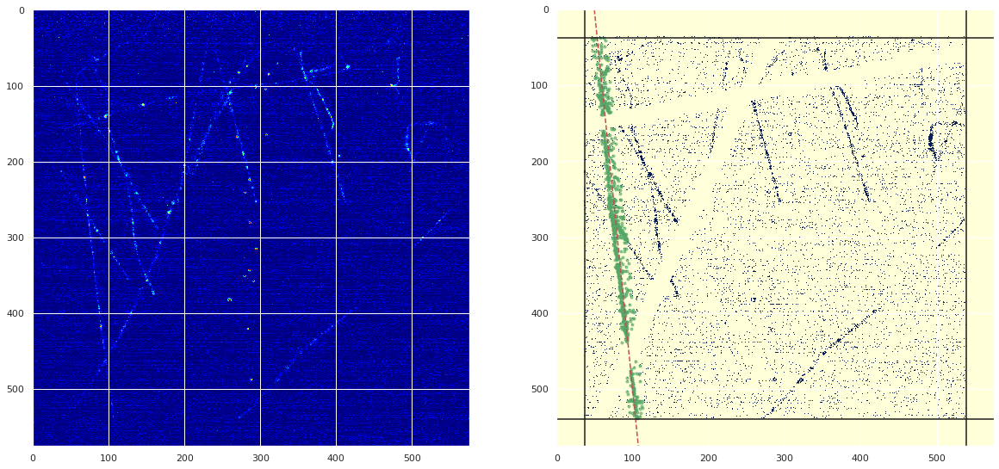

DEBUG: number of points, clusters: 14160 3
(array([276.75954537, 293.7439176 ]), array([0.18099581, 0.98348387]))
(array([247.50282486, 125.06327684]), array([0.96864211, 0.24846017]))
ph 42517, dim: 14160
x,y start: 320, 148, x,y stop: 828, 2152, length: 2067: 
Mean squared error: 27.55
Coefficient of determination: 0.9729


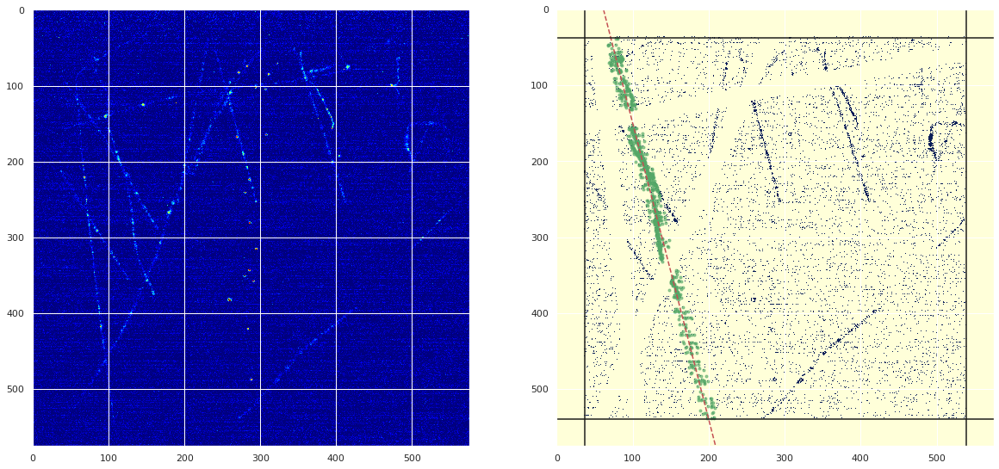

DEBUG: number of points, clusters: 11968 4
(array([279.25469789, 308.1298063 ]), array([ 0.72304168, -0.69080441]))
(array([220.05481283, 406.22058824]), array([0.95398787, 0.29984519]))
ph 36878, dim: 11968
x,y start: 1368, 152, x,y stop: 2012, 2152, length: 2101: 
Mean squared error: 40.66
Coefficient of determination: 0.9751


In [ ]:
from skimage.measure import LineModelND, ransac, CircleModel
from skimage import io, feature, color, measure, draw, img_as_float
from sklearn.metrics import mean_squared_error, r2_score


#KFC cosmici
runI          = [4035]
run_ped       = 4034

#KFC Fe
runI          = [4039]
run_ped       = 4038

cimax         = 10
cimin         = 0 
tag           = 'LAB'
nsigma        = 0.5
fiducial_cut  = 150 # pixel
version       = 'v0.1'
doRescale     = True
debug         = True

columns = ["iTr", "cluster_lable", "pixels", "photons", "ph_pixels", "x0start", "y0start", 
          "x0end", "y0end", "length", "mse", "r2"]

###############################################################
cfile = cy.open_(runI[0], tag=tag, posix=posix, verbose=False)
if cfile.x_resolution == 2048:
    rescale = 512 # orca flash
else:
    rescale = 576 # fusion


if not doRescale: 
    rescale = cfile.x_resolution
    
        
tscale = int(cfile.x_resolution/rescale)
print("rascale: ", tscale)
fiducial_cut = np.int(fiducial_cut/tscale)
#########################

m_image, s_image = cy.ped_(run_ped, path=mybasepath+'ped/')

#########################

th_image   = np.round(m_image + nsigma*s_image)
print ("light over Th: %.2f " % (th_image.sum()-m_image.sum()))
    
for nRi in range(len(runI)):
    try:
        # open file
        cfile = cy.open_(runI[nRi], tag=tag, posix=posix, verbose=True)
    except:
        print ('Problem in open file: ', runI[nRi])
        break
    #
    #
    # crea un db vuoto da riempire 
    df = pd.DataFrame(columns = columns)
    # crea nome file di output
    file_out = (mybasepath+"out/cosmics_run%d_cmin_%d_cmax_%d_rescale_%d_nsigma_%.1f_ev_%d_ped_%d_%s.plk.gz" % 
                (runI[nRi], cimin, cimax, rescale, nsigma, cfile.max_image, run_ped, version))
    #
    
    for iTr in range(0, cfile.max_image): # max_image per tutte le imagini cfile.max_image
        #if iTr % 10 == 0: 
          # running & debug ...
        start_time = time.time()
        print ('Processing RUN: ', runI[nRi], 'Event: ', iTr)
        
          # end 

        image = rtnp.hist2array(cfile.file.Get(cfile.pic[iTr])).T
        raw_image       = np.subtract(image,m_image)
        rebin_image     = cy.rebin(raw_image, (rescale, rescale))  
        rebin_th_image  = cy.rebin((th_image-m_image), (rescale, rescale))
        
        for ic in range(10):
            if ic>0:
                for i in range(xc.shape[0]):
                    edges[int(yc[i]), int(xc[i])]=0
            else:
                edges = (rebin_image > rebin_th_image) & (rebin_image < cimax)
                
            edges_fiducial = edges
            edges_fiducial[0:fiducial_cut,:]=0
            edges_fiducial[edges.shape[0]-fiducial_cut:edges.shape[0],:]=0
            edges_fiducial[:,0:fiducial_cut]=0
            edges_fiducial[:,edges.shape[1]-fiducial_cut:edges.shape[1]]=0
            
            points          = np.array(np.nonzero(edges_fiducial)).T.astype(float)
            model = LineModelND()
            model.estimate(points)

            # robustly fit line only using inlier data with RANSAC algorithm
            model_robust, inliers = ransac(points, LineModelND, min_samples=2,
                                           residual_threshold=10, max_trials=1000)
            outliers = inliers == False

            # generate coordinates of estimated models
            line_x = np.arange(0, rebin_image.shape[1])
            line_y = model.predict_y(line_x)
            line_y_robust = model_robust.predict_y(line_x)

            xc = points[inliers, 1]
            yc = points[inliers, 0]        
        
            for j in range(0, xc.shape[0]):
                x=int(xc[j])
                y=int(yc[j])
                if j == 0:
                    x0start = x*tscale
                    y0start = y*tscale
            x0end   = x*tscale
            y0end   = y*tscale
            
            length  = np.sqrt((x0end - x0start)**2 + (y0end - y0start)**2)
            ph, dim = cy.cluster_par(xc, yc, rebin_image)
            ph      = ph*tscale*tscale
            dim     = dim*tscale*tscale
            
            mse = mean_squared_error(points[inliers][:,1], model_robust.predict_y(points[inliers][:,0]))
            r2  = r2_score(points[inliers][:,1], model_robust.predict_y(points[inliers][:,0]))
#             if dim<2000 or mse>5 or r2<0.95:
#                 print ("track: ", ic)
#                 break
            df  = df.append({columns[0]:iTr, columns[1]:ic, columns[2]:dim, columns[3]:ph, columns[4]:ph/dim, 
                columns[5]:x0start, columns[6]:y0start, columns[7]:x0end, columns[8]:y0end, 
                columns[9]:length, columns[10]:mse, columns[11]:r2},
                ignore_index=True)
            if (iTr % 10 == 0 and ic == 0) or debug:
                print ("DEBUG: number of points, clusters: " +str(dim), ic) 


                print(model.params)
                print(model_robust.params)

                fig, ax = plt.subplots (1,2, figsize=(20,10))
                ax[0].imshow(rebin_image, cmap='jet', vmin=0, vmax=20)
                ax[1].imshow(edges_fiducial, cmap='YlGnBu', vmin=0,vmax=1)
                ax[1].plot(xc, yc, '.g', alpha=0.6,
                label='Inlier data', markersize=6)
                ax[1].plot(line_y_robust, line_x, '--r', label='Robust line model')
                ax[1].set_xlim(0,rebin_image.shape[1]-1)
                ax[1].set_ylim(rebin_image.shape[0]-1,0)
                ax[1].axvline(fiducial_cut, color='k')
                ax[1].axvline(edges.shape[1]-fiducial_cut, color='k')
                ax[1].axhline(fiducial_cut, color='k')
                ax[1].axhline(edges.shape[0]-fiducial_cut, color='k')
                print("ph {:.0f}, dim: {:d}".format(ph, dim))

                print("x,y start: {:d}, {:d}, x,y stop: {:d}, {:d}, length: {:.0f}: ".format(
                    x0start, y0start, x0end, y0end, length))
                print('Mean squared error: {:.2f}'.format(mse))
                # The coefficient of determination: 1 is perfect prediction
                print('Coefficient of determination: {:.4f}'.format(r2))
                plt.show()

        print ("Elapsed time 10 events: {:.1f}".format(time.time() - start_time))


        start_time = time.time()
    df.to_pickle(file_out, compression='gzip')
    print ("out file", file_out)

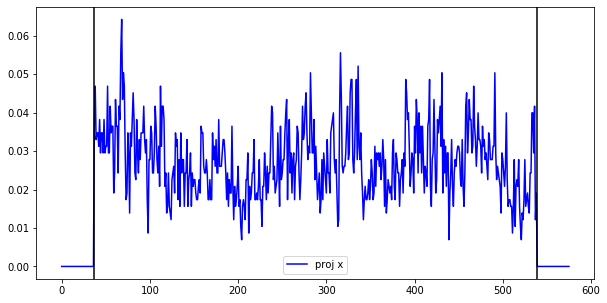

In [42]:
def proj_xy(img_data, x=True, y=True):
    import numpy as np
    import matplotlib.pyplot as plt
    if x:
        y_x = np.mean(img_data, axis=0)
        x_x = np.arange(0, img_data.shape[1])
        ax.plot(x_x, y_x, 'b', label='proj x')
    if y:
        y_y = np.mean(img_data, axis=1)
        x_y = np.arange(0, img_data.shape[0])
        ax.plot(x_y, y_y, 'r', label='proj y', alpha= 0.5)
    # for i in range(1,len(yy)):
    #     dy = yy[i]-yy[i-1]
    #     if abs(dy)<0.005:
    #         ax.axvline(i, color='k')
    ax.legend()
    return ax
fig, ax = plt.subplots(1,1, figsize=(10,5))
proj_xy(edges, y=False)
ax.axvline(fiducial_cut, color='k')
ax.axvline(edges.shape[0]-fiducial_cut, color='k')
plt.show()

# debug

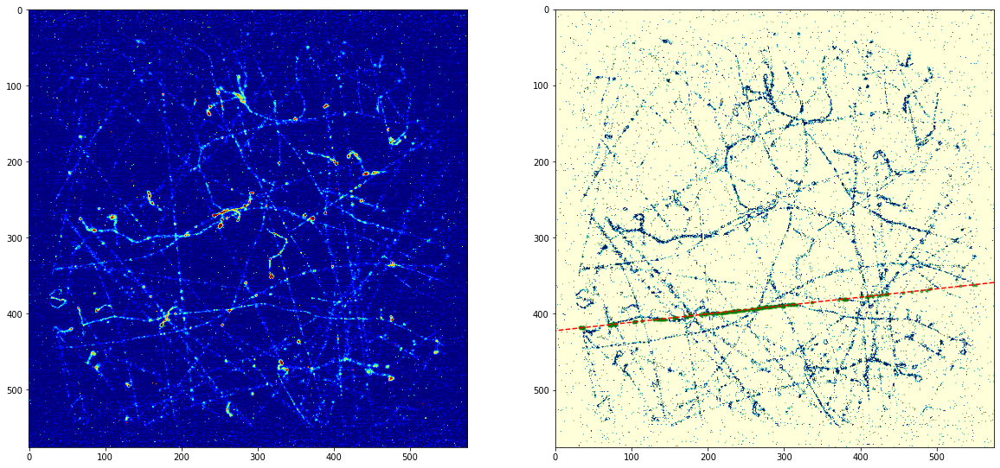

In [16]:
fig, ax = plt.subplots (1,2, figsize=(20,10))
ax[0].imshow(rebin_image, cmap='jet', vmin=0, vmax=20)
ax[1].imshow(edges, cmap='YlGnBu', vmin=0,vmax=1)
ax[1].plot(xc, yc, '.g', alpha=0.6,
label='Inlier data', markersize=6)
ax[1].plot(line_y_robust, line_x, '--r', label='Robust line model')
ax[1].set_xlim(0,rebin_image.shape[1]-1)
ax[1].set_ylim(rebin_image.shape[0]-1,0)
plt.show()

In [15]:
def n_tarp(x, y, ax, image = np.array([]), n_std=3.0, facecolor='none', **kwargs):
    from matplotlib.patches import Rectangle
    mean_x = x.mean()
    mean_y = y.mean()
    std_x = x.std()
    std_y = y.std()
    half_width = n_std * std_x
    half_height = n_std * std_y
    if image.any():
        rimage = image*0
        xs = int(mean_x - half_width)+1
        xe = int(mean_x + half_width)+1
        ys = int(mean_y - half_height)+1
        ye = int(mean_y + half_height)+1
        # print(ys,ye, xs,xe)
        rimage[ys:ye, xs:xe]=image[ys:ye, xs:xe]
        # print (rimage)
        # print(rimage.sum())
        
    rectangle = Rectangle(
        (mean_x - half_width, mean_y - half_height),
        2 * half_width, 2 * half_height, facecolor=facecolor, **kwargs)
    return ax.add_patch(rectangle), rimage  


def n_std_rectangle(x, y, ax, image = np.array([]), n_std=3.0, facecolor='none', **kwargs):
    from matplotlib.patches import Rectangle
    mean_x = x.mean()
    mean_y = y.mean()
    std_x = x.std()
    std_y = y.std()
    half_width = n_std * std_x
    half_height = n_std * std_y
    if image.any():
        rimage = image*0
        xs = int(mean_x - half_width)+1
        xe = int(mean_x + half_width)+1
        ys = int(mean_y - half_height)+1
        ye = int(mean_y + half_height)+1
        # print(ys,ye, xs,xe)
        rimage[ys:ye, xs:xe]=image[ys:ye, xs:xe]
        # print (rimage)
        # print(rimage.sum())
        
    rectangle = Rectangle(
        (mean_x - half_width, mean_y - half_height),
        2 * half_width, 2 * half_height, facecolor=facecolor, **kwargs)
    return ax.add_patch(rectangle), rimage  

def confidence_ellipse(x, y, ax, image = np.array([]), n_std=3.0, facecolor='none', **kwargs):
    from matplotlib.patches import Ellipse
    import matplotlib.transforms as transforms
    import numpy as np

    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0),
        width=ell_radius_x * 2,
        height=ell_radius_y * 2,
        facecolor=facecolor,
        **kwargs)

    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)
    if image.any():
        # ellsisse e' (x-x0)**2/a**2 + (y-y0)**2/b**2 < 1
        # print (mean_x, mean_y, ell_radius_x*scale_x, ell_radius_y*scale_y)
        rimage = image*0
        ar = abs(pearson)
        for x in range(image.shape[1]):
            for y in range(image.shape[0]):
                xr = (y-mean_y)*np.sin(ar)+(x-mean_x)*np.cos(ar)
                yr = (y-mean_y)*np.cos(ar)-(x-mean_x)*np.sin(ar)
                if (xr)**2/(ell_radius_x*scale_x)**2 + (yr)**2/(ell_radius_y*scale_y)**2 < 1:
                    rimage[y,x]=image[y, x]
        # print (rimage)
        # print(rimage.sum())
    
    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)

    return ax.add_patch(ellipse), rimage 


def confidence_ellipse_par(x, y, image = np.array([]), n_std=3.0, facecolor='none', **kwargs):
    import numpy as np

    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])

    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
                           
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)
                           
    width=scale_x*ell_radius_x * 2 
    height=scale_y*ell_radius_y * 2              
    if image.any():
        # ellsisse e' (x-x0)**2/a**2 + (y-y0)**2/b**2 < 1
        # print (mean_x, mean_y, ell_radius_x*scale_x, ell_radius_y*scale_y)
        rimage = image*0
        ar = abs(pearson)
        for x in range(image.shape[1]):
            for y in range(image.shape[0]):
                xr = (y-mean_y)*np.sin(ar)+(x-mean_x)*np.cos(ar)
                yr = (y-mean_y)*np.cos(ar)-(x-mean_x)*np.sin(ar)
                if (xr)**2/(ell_radius_x*scale_x)**2 + (yr)**2/(ell_radius_y*scale_y)**2 < 1:
                    rimage[y,x]=image[y, x]
        # print (rimage)
        # print(rimage.sum())
    else:
        rimage = np.array([])

    
    return width, height, pearson, rimage.sum(), np.size(rimage[rimage>0])


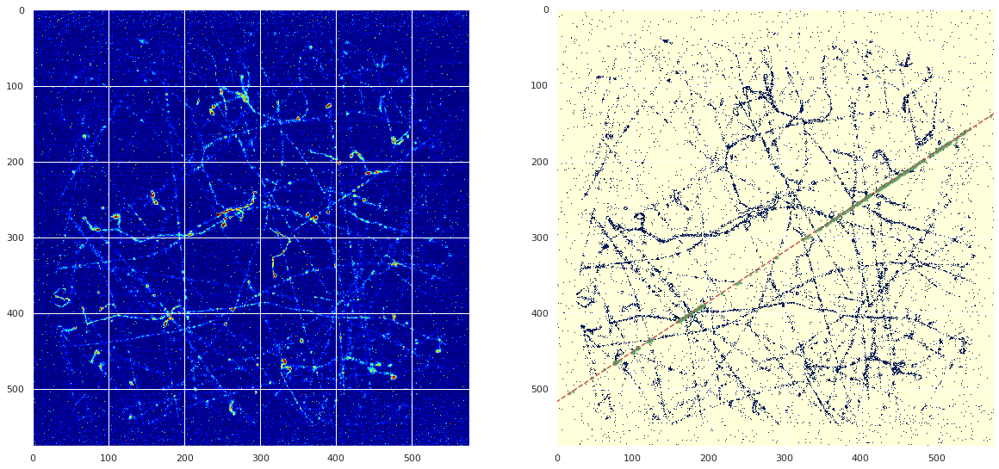

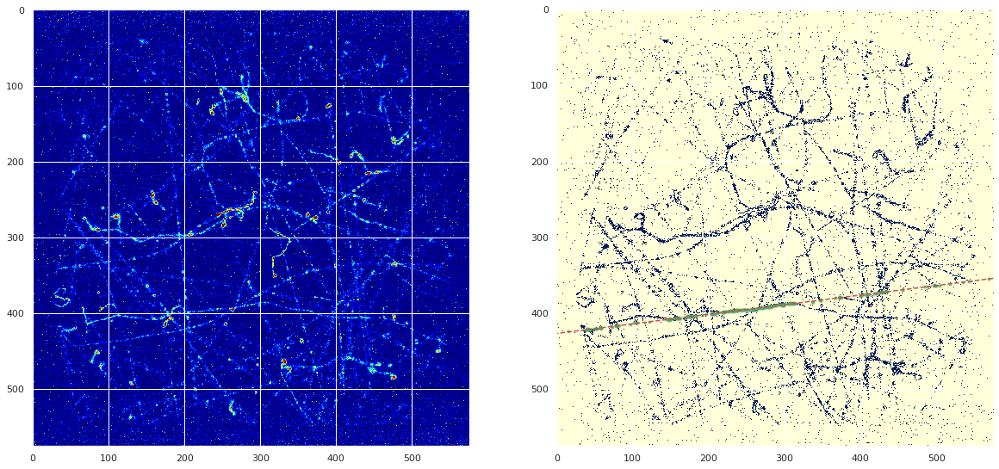

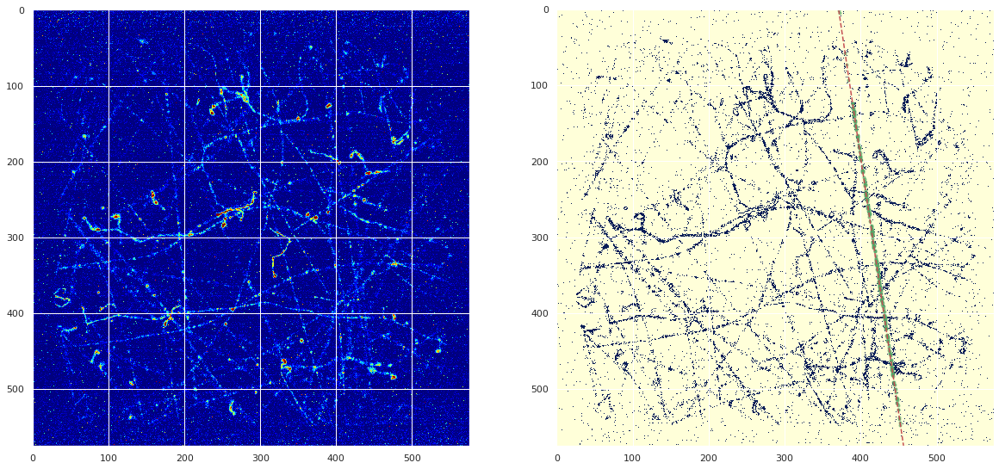

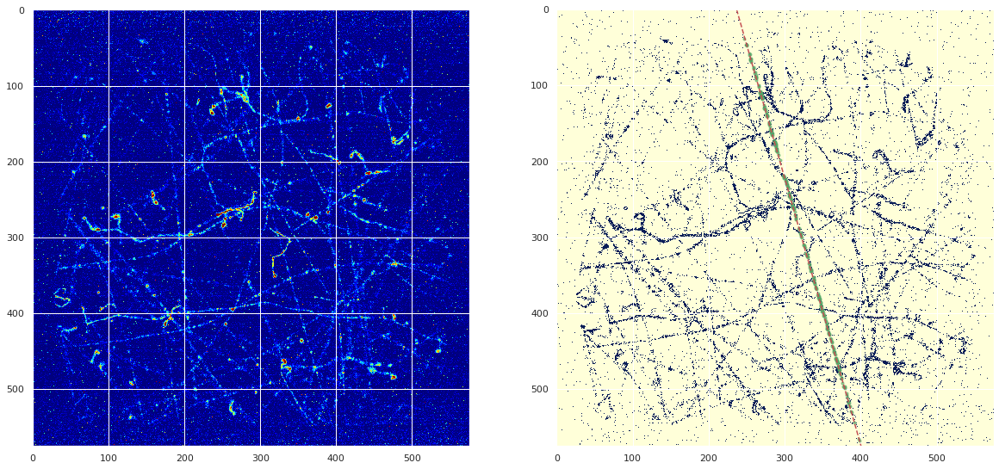

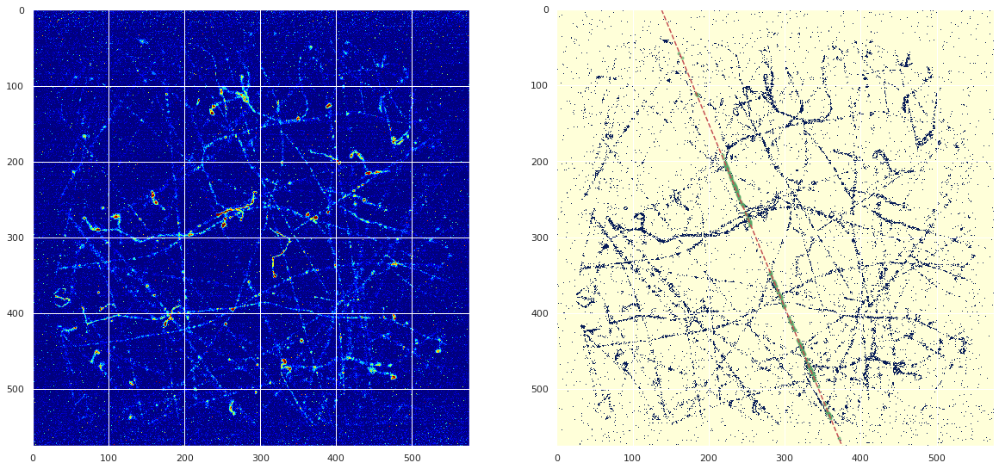

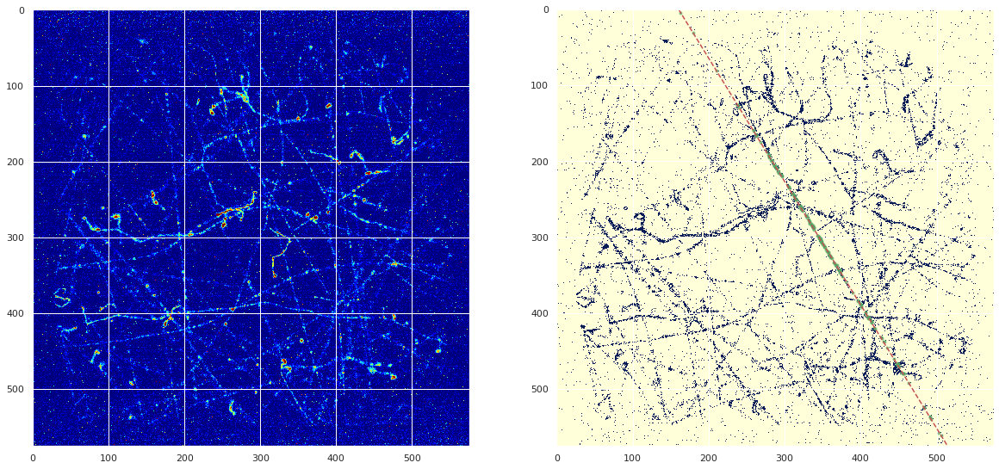

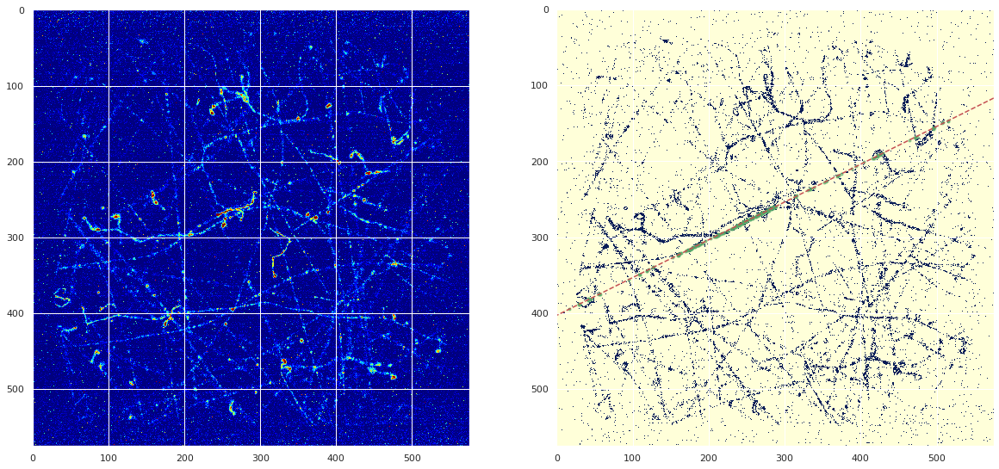

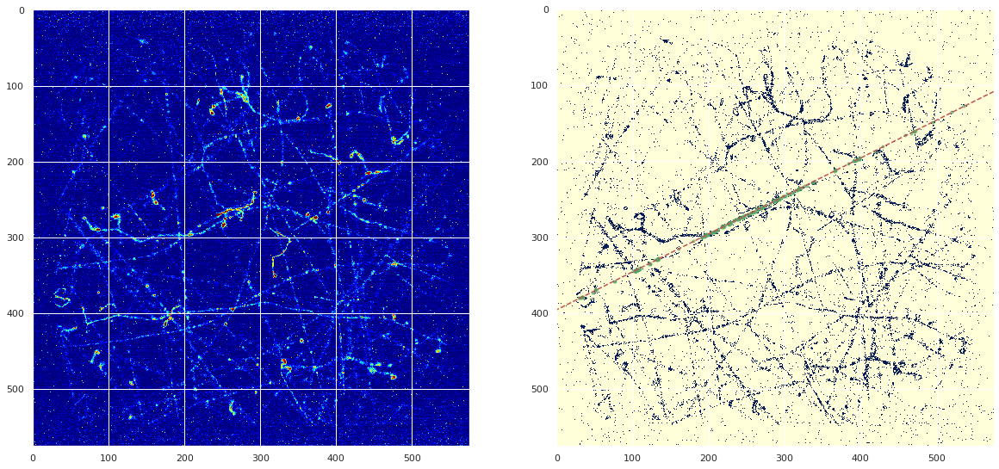

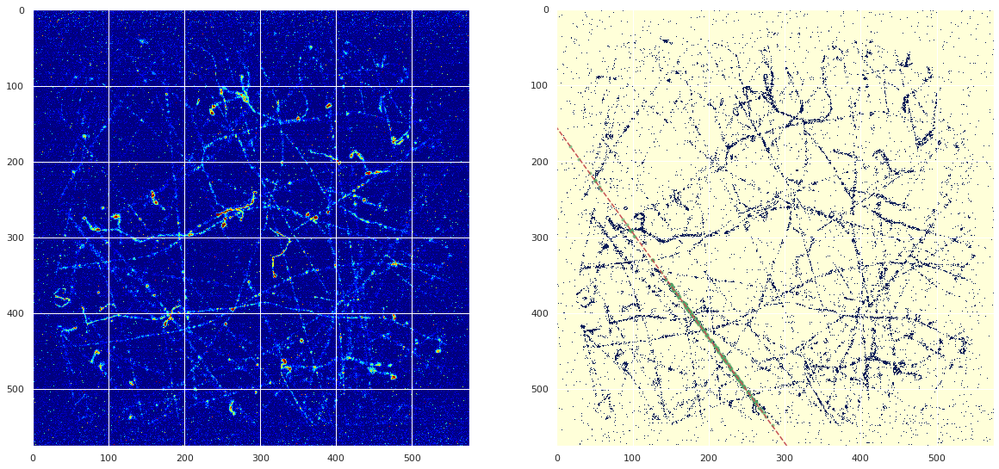

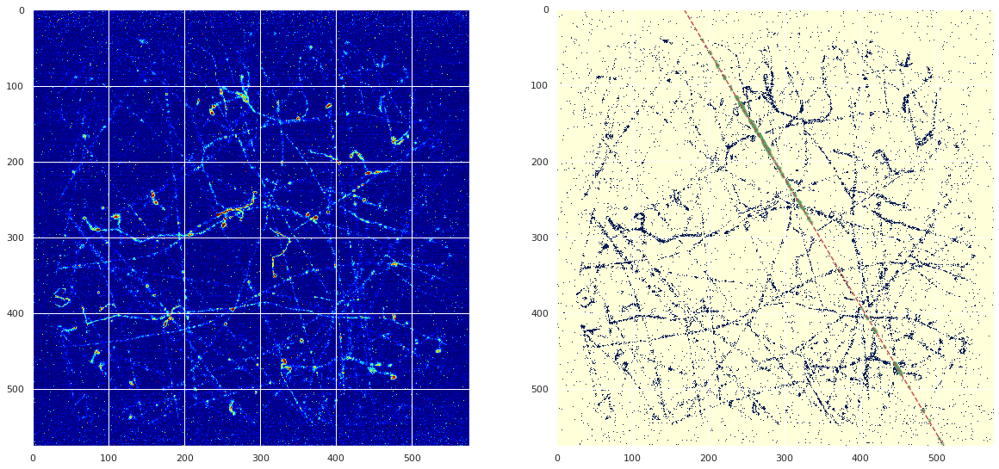

In [61]:
for k in range(10):
    for i in range(xc.shape[0]):
        edges[int(yc[i]), int(xc[i])]=0
    points          = np.array(np.nonzero(edges)).T.astype(float)
    model = LineModelND()
    model.estimate(points)

    # robustly fit line only using inlier data with RANSAC algorithm
    model_robust, inliers = ransac(points, LineModelND, min_samples=2,
                                   residual_threshold=1, max_trials=1000)
    outliers = inliers == False

    # generate coordinates of estimated models
    line_x = np.arange(0, rebin_image.shape[1])
    line_y = model.predict_y(line_x)
    line_y_robust = model_robust.predict_y(line_x)

    xc = points[inliers, 1]
    yc = points[inliers, 0]
    fig, ax = plt.subplots (1,2, figsize=(20,10))
    ax[0].imshow(rebin_image, cmap='jet', vmin=0, vmax=20)
    ax[1].imshow(edges, cmap='YlGnBu', vmin=0,vmax=1)
    ax[1].plot(xc, yc, '.g', alpha=0.6,
    label='Inlier data', markersize=6)
    ax[1].plot(line_y_robust, line_x, '--r', label='Robust line model')
    ax[1].set_xlim(0,rebin_image.shape[1]-1)
    ax[1].set_ylim(rebin_image.shape[0]-1,0)
    plt.show()